In [1]:
import os
import shutil
import anndata as an
import scanpy as sc
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.gridspec as gridspec
import seaborn as sns
from pathlib import Path
from sklearn.decomposition import PCA
from deside.utility import (ExpObj, set_fig_style, sorted_cell_types, 
                            get_corr, check_dir, cancer_types, get_ccc, 
                            read_cancer_purity, calculate_rmse)
from deside.utility.compare import read_and_merge_result
from deside.plot import plot_pca
from deside.utility.read_file import ReadH5AD
# from matplotlib_venn import venn2
from sklearn.metrics import median_absolute_error
set_fig_style(font_family='Arial', font_size=8)

2023-12-19 14:28:09.390342: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
result_dir = '../../results/whole_workflow_20231110_12ds_subtypes/DeSide_03_new_ds_subtypes_all_range/'
dataset_dir = r'../../datasets/'
fig_dir = './sup_fig_results/'
model_evaluation_dir = '../../tables_model_evaluation/'

## 01. r-sec2-1 (PCA-plot)
Comparing simulated dataset and TCGA in the first hidden layer

In [3]:
def read_pca_data(file_path, name_mapping):
    pca_lower_dim = pd.read_csv(file_path, index_col=0)
    selected_list = []
    for k, v in name_mapping.items():
        current_part = pca_lower_dim.loc[pca_lower_dim['class'] == k, :].copy()
        selected_list.append(current_part)
    selected_all = pd.concat(selected_list)
    print(selected_all.shape)
    selected_all['class'] = selected_all['class'].map(name_mapping)
    return selected_all

In [4]:
dataset2color = {'TCGA': 'C5', 'D0': 'C0', 'D1': 'C1', 'D2': 'C2'}

### D0: Mixed_N100K_random

In [5]:
dataset_name = 'Mixed_N100K_random'
dataset_name_abbr = 'D0'
dataset_name_new = 'D0'
d0_file_path = os.path.join(result_dir, dataset_name, 'l_first_pca_lower_dim.csv')
d0_pca = read_pca_data(file_path=d0_file_path, name_mapping={dataset_name_abbr: dataset_name_new, 'TCGA': 'TCGA'})
d0_pca.head(2)

(107699, 4)


,dataset_name,PC1,PC2,class
index,,,,
s_random_0_0,Mixed_N100K_random,-0.632493,0.836286,D0
s_random_0_1,Mixed_N100K_random,0.153723,0.250546,D0


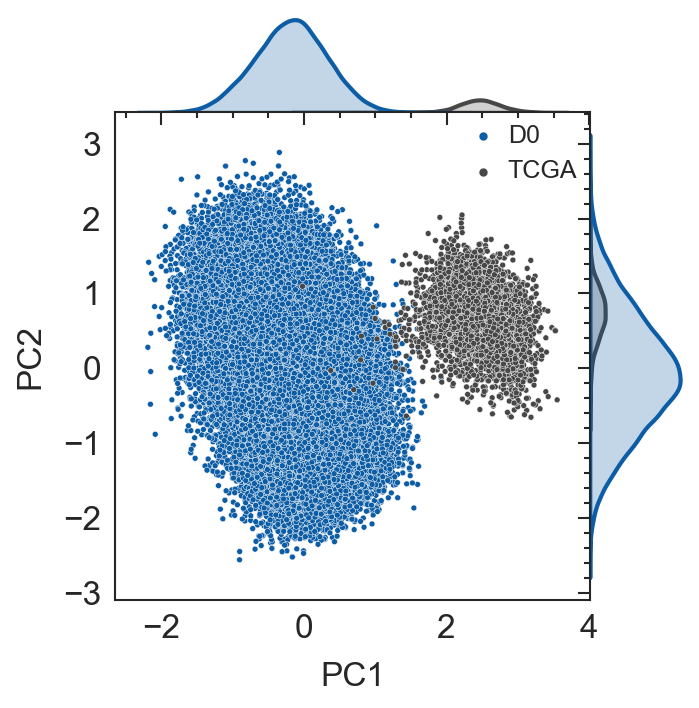

In [6]:
g1 = sns.jointplot(x=f'PC1', y=f'PC2', data=d0_pca, kind='scatter', 
                   hue='class', s=2, height=2.5, space=0, rasterized=True, palette=dataset2color)
g1_ax = g1.ax_joint
g1_ax.set_xticks([-2, 0.0, 2.0, 4.0])
g1legend = g1_ax.legend(loc='upper right', fontsize=6, borderpad=0, handletextpad=0)
for _ in g1legend.legendHandles:
    _.set_sizes([1])
# sns.despine(g1_ax)
g1.ax_marg_x.tick_params(axis='x', which='both', top=False)
g1.ax_marg_x.grid(False)
g1.ax_marg_y.tick_params(axis='y', which='both', right=False)
g1.ax_marg_y.grid(False)

plt.savefig(os.path.join(fig_dir, f'l1_pca_{dataset_name_new}.svg'), dpi=300)

### D2: Mixed_N100K_segment_without_filtering

In [7]:
dataset_name = 'Mixed_N100K_segment_without_filtering'
dataset_name_abbr = 'D2'
dataset_name_new = 'D2'
d2_file_path = os.path.join(result_dir, dataset_name, 'l_first_pca_lower_dim.csv')
d2_pca = read_pca_data(file_path=d2_file_path, name_mapping={dataset_name_abbr: dataset_name_new, 'TCGA': 'TCGA'})
d2_pca.head(2)

(107699, 4)


,dataset_name,PC1,PC2,class
index,,,,
s_segment_0_1,Mixed_N100K_segment_without_filtering,-0.313328,5.091577,D2
s_segment_0_10,Mixed_N100K_segment_without_filtering,-3.868020,-5.181135,D2


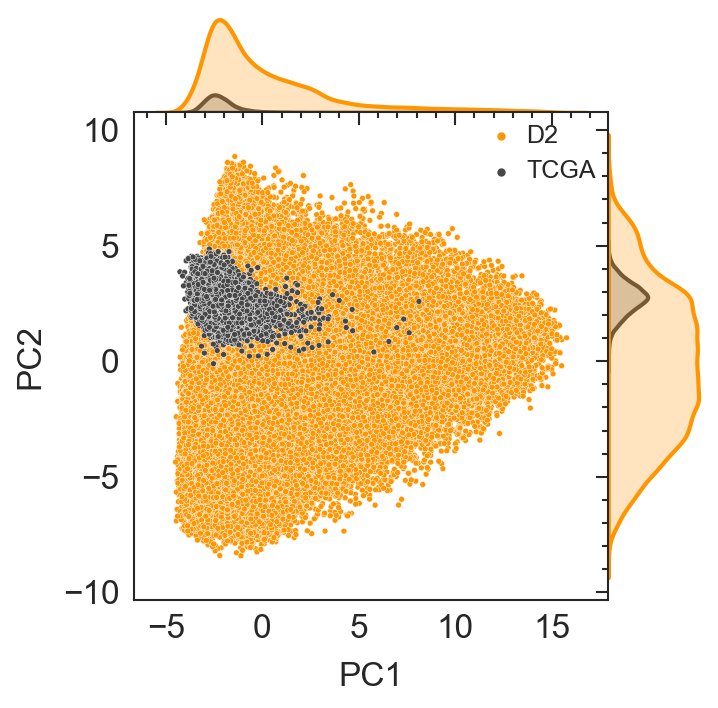

In [8]:
g1 = sns.jointplot(x=f'PC1', y=f'PC2', data=d2_pca, kind='scatter', 
                   hue='class', s=2, height=2.5, space=0, rasterized=True, palette=dataset2color)
g1_ax = g1.ax_joint
g1_ax.set_xticks([-5, 0.0, 5.0, 10, 15])
g1legend = g1_ax.legend(loc='upper right', fontsize=6, borderpad=0, handletextpad=0)
for _ in g1legend.legendHandles:
    _.set_sizes([1])
# sns.despine(g1_ax)
g1.ax_marg_x.tick_params(axis='x', which='both', top=False)
g1.ax_marg_x.grid(False)
g1.ax_marg_y.tick_params(axis='y', which='both', right=False)
g1.ax_marg_y.grid(False)

plt.savefig(os.path.join(fig_dir, f'l1_pca_{dataset_name_new}.svg'), dpi=300)

### D1: Mixed_N100_segment_filtered

In [9]:
dataset_name = 'Mixed_N100K_segment_filtered'
dataset_name_abbr = 'D1'
dataset_name_new = 'D1'
d1_file_path = os.path.join(result_dir, dataset_name, 'l_first_pca_lower_dim.csv')
d1_pca = read_pca_data(file_path=d1_file_path, name_mapping={dataset_name_abbr: dataset_name_new, 'TCGA': 'TCGA'})
d1_pca.head(2)

(107699, 4)


,dataset_name,PC1,PC2,class
index,,,,
s_segment_0_1008,Mixed_N100K_segment_filtered,-1.140261,-1.040979,D1
s_segment_0_101,Mixed_N100K_segment_filtered,0.787477,-2.335373,D1


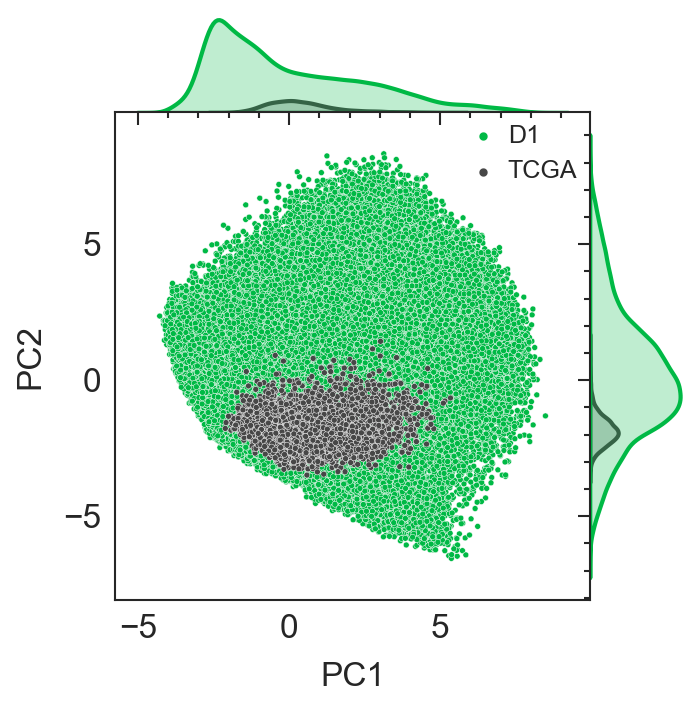

In [10]:
g1 = sns.jointplot(x=f'PC1', y=f'PC2', data=d1_pca, kind='scatter', 
                   hue='class', s=2, height=2.5, space=0, rasterized=True, palette=dataset2color)
g1_ax = g1.ax_joint
g1_ax.set_xticks([-5, 0.0, 5.0])
g1legend = g1_ax.legend(loc='upper right', fontsize=6, borderpad=0, handletextpad=0)
for _ in g1legend.legendHandles:
    _.set_sizes([1])
# sns.despine(g1_ax)
g1.ax_marg_x.tick_params(axis='x', which='both', top=False)
g1.ax_marg_x.grid(False)
g1.ax_marg_y.tick_params(axis='y', which='both', right=False)
g1.ax_marg_y.grid(False)

plt.savefig(os.path.join(fig_dir, f'l1_pca_{dataset_name_new}.svg'), dpi=300)

### D1 + D2

In [11]:
dataset_name = 'Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering'
dataset_name_new = 'D1+D2'
d1d2_file_path = os.path.join(result_dir, dataset_name, 'l_first_pca_lower_dim.csv')
d1d2_pca = read_pca_data(file_path=d1d2_file_path, name_mapping={'D2': 'D2', 'D1': 'D1', 'TCGA': 'TCGA'})
d1d2_pca.head(2)

(207699, 4)


,dataset_name,PC1,PC2,class
index,,,,
s_segment_0_1,Mixed_N100K_segment_without_filtering,-0.299397,2.798725,D2
s_segment_0_10,Mixed_N100K_segment_without_filtering,3.249196,-5.541225,D2


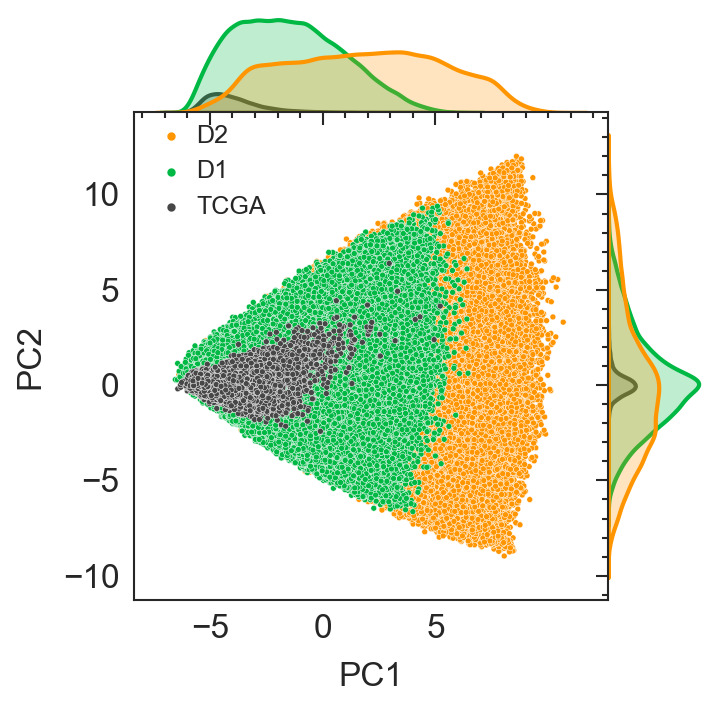

In [12]:
g1 = sns.jointplot(x=f'PC1', y=f'PC2', data=d1d2_pca, kind='scatter', 
                   hue='class', s=2, height=2.5, space=0, rasterized=True, palette=dataset2color)
g1_ax = g1.ax_joint
g1_ax.set_xticks([-5, 0.0, 5.0])
g1legend = g1_ax.legend(loc='upper left', fontsize=6, borderpad=0, handletextpad=0)
for _ in g1legend.legendHandles:
    _.set_sizes([1])
# sns.despine(g1_ax)
g1.ax_marg_x.tick_params(axis='x', which='both', top=False)
g1.ax_marg_x.grid(False)
g1.ax_marg_y.tick_params(axis='y', which='both', right=False)
g1.ax_marg_y.grid(False)

plt.savefig(os.path.join(fig_dir, f'l1_pca_{dataset_name_new}.svg'), dpi=300)

## 02. r-sec4-1 (Scatter plot)
The correlation of cell proportions and signature socres for other cell types (B Cells, CD8 T,  DC, Endothelial Cells, Fibroblasts, Macrophages, Mast Cells, Neutrophils, NK);

In [13]:
# outlier_file_path = os.path.join(dataset_dir, 'TCGA', 'outliers_TCGA.csv')
outlier_file_path = None
dataset_names = ['Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering'] + \
                [f'Mixed_N100K_segment_filtered_{i}-Mixed_N100K_segment_without_filtering' for i in range(1, 5)] + \
                ['Mixed_N100K_random'] + [f'Mixed_N100K_random_{i}' for i in range(1, 5)] + \
                ['Mixed_N100K_segment_filtered'] + [f'Mixed_N100K_segment_filtered_{i}' for i in range(1, 5)] + \
                ['Mixed_N100K_segment_without_filtering'] + [f'Mixed_N100K_segment_without_filtering_{i}' for i in range(1, 5)]
dataset_names

['Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_segment_filtered_1-Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_segment_filtered_2-Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_segment_filtered_3-Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_segment_filtered_4-Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_random',
 'Mixed_N100K_random_1',
 'Mixed_N100K_random_2',
 'Mixed_N100K_random_3',
 'Mixed_N100K_random_4',
 'Mixed_N100K_segment_filtered',
 'Mixed_N100K_segment_filtered_1',
 'Mixed_N100K_segment_filtered_2',
 'Mixed_N100K_segment_filtered_3',
 'Mixed_N100K_segment_filtered_4',
 'Mixed_N100K_segment_without_filtering',
 'Mixed_N100K_segment_without_filtering_1',
 'Mixed_N100K_segment_without_filtering_2',
 'Mixed_N100K_segment_without_filtering_3',
 'Mixed_N100K_segment_without_filtering_4']

In [14]:
rep_5_d1d2 = dataset_names[:5]
rep_5_d0 = dataset_names[5:10]
rep_5_d1 = dataset_names[10:15]
rep_5_d2 = dataset_names[15:]
rep_dict = {'rep_5_d1d2': rep_5_d1d2, 'rep_5_d0': rep_5_d0, 'rep_5_d1': rep_5_d1, 'rep_5_d2': rep_5_d2}
for k, v in rep_dict.items():
    print(k, v)

rep_5_d1d2 ['Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering', 'Mixed_N100K_segment_filtered_1-Mixed_N100K_segment_without_filtering', 'Mixed_N100K_segment_filtered_2-Mixed_N100K_segment_without_filtering', 'Mixed_N100K_segment_filtered_3-Mixed_N100K_segment_without_filtering', 'Mixed_N100K_segment_filtered_4-Mixed_N100K_segment_without_filtering']
rep_5_d0 ['Mixed_N100K_random', 'Mixed_N100K_random_1', 'Mixed_N100K_random_2', 'Mixed_N100K_random_3', 'Mixed_N100K_random_4']
rep_5_d1 ['Mixed_N100K_segment_filtered', 'Mixed_N100K_segment_filtered_1', 'Mixed_N100K_segment_filtered_2', 'Mixed_N100K_segment_filtered_3', 'Mixed_N100K_segment_filtered_4']
rep_5_d2 ['Mixed_N100K_segment_without_filtering', 'Mixed_N100K_segment_without_filtering_1', 'Mixed_N100K_segment_without_filtering_2', 'Mixed_N100K_segment_without_filtering_3', 'Mixed_N100K_segment_without_filtering_4']


In [15]:
def read_pred_result(file_path, col_names, outlier_file_path=None):
    cell_prop = pd.read_csv(file_path, index_col=0)
    sample_inx = cell_prop.index
    if not (outlier_file_path is None):
        outliers = pd.read_csv(outlier_file_path, index_col=0)
        # print(f'{outliers.shape[0]} outliers will be removed')
        sample_inx = cell_prop.loc[~cell_prop.index.isin(outliers.index), :].index
    cell_prop = cell_prop.loc[sample_inx, col_names].copy()
    return cell_prop

In [16]:
ct_not_include = ['Cancer Cells', 'Plasma B cells', 'Non-plasma B cells', 
                  'CD4 T conv', 'CD4 Treg', 'CD8 T effector', 'CD8 T (GZMK high)', 
                  'Double-neg-like T', 'Epithelial Cells', 'Glioma Cells', 
                  'mDC', 'pDC', 'Fibroblasts']
cell_types = [i for i in sorted_cell_types if i not in ct_not_include]
cell_types

['B Cells',
 'CD4 T',
 'CD8 T',
 'DC',
 'Endothelial Cells',
 'CAFs',
 'Myofibroblasts',
 'Macrophages',
 'Mast Cells',
 'NK',
 'Neutrophils',
 'Monocytes']

In [17]:
def get_signature_score_and_pred_prop_corr(result_dir, cell_type, dataset_names, rep_dict: dict = None, outlier_file_path=None):
    result = None
    # sample_id = None
    for ds in dataset_names:
        col_marker_mean = f'{cell_type}_marker_mean'
        y_pred_file_path = os.path.join(result_dir, ds, 'predicted_cell_fraction_tcga', 'merged_all_signature_score_and_cell_fraction_by_DeSide.csv')
        _ = read_pred_result(y_pred_file_path, col_names=[cell_type, col_marker_mean, 'cancer_type'], outlier_file_path=outlier_file_path)
        if result is None:
            result = pd.DataFrame(index=_.index, columns=dataset_names)
        else:
            assert np.all(result.index == _.index)
        result[ds] = _[cell_type]
        if col_marker_mean not in result.columns:
            result[col_marker_mean] = _[col_marker_mean]
        if 'cancer_type' not in result.columns:
            result['cancer_type'] = _['cancer_type']
    # calculate the correlation for each cancer type between the predicted cell prop and signature score in each dataset 
    cell_prop_vs_marker_exp_corr = pd.DataFrame(index=result['cancer_type'].unique(), columns=dataset_names)
    for cancer_type, _group in result.groupby('cancer_type'):
        for ds in dataset_names:
            cell_prop_vs_marker_exp_corr.loc[cancer_type, ds] = get_corr(_group[ds], _group[col_marker_mean])
    # calculate the mean and std of correlation across 5 replicates
    for k, rep in rep_dict.items():
        cell_prop_vs_marker_exp_corr[f'{k}_mean'] = cell_prop_vs_marker_exp_corr.loc[:, rep].mean(axis=1)
        cell_prop_vs_marker_exp_corr[f'{k}_std'] = cell_prop_vs_marker_exp_corr.loc[:, rep].std(axis=1)
    cell_prop_vs_marker_exp_corr.fillna(0, inplace=True)
    
    return cell_prop_vs_marker_exp_corr

In [18]:
cell_type2sig_prop_corr = {}
for ct in cell_types:
    cell_type2sig_prop_corr[ct] = get_signature_score_and_pred_prop_corr(result_dir=result_dir, cell_type=ct, 
                                                                         dataset_names=dataset_names, 
                                                                         rep_dict=rep_dict)

/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [19]:
cell_type2sig_prop_corr['CD4 T'].head(2)

,Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_1-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_2-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_3-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_4-Mixed_N100K_segment_without_filtering,Mixed_N100K_random,Mixed_N100K_random_1,Mixed_N100K_random_2,Mixed_N100K_random_3,Mixed_N100K_random_4,...,Mixed_N100K_segment_without_filtering_3,Mixed_N100K_segment_without_filtering_4,rep_5_d1d2_mean,rep_5_d1d2_std,rep_5_d0_mean,rep_5_d0_std,rep_5_d1_mean,rep_5_d1_std,rep_5_d2_mean,rep_5_d2_std
ACC,0.363306,0.298457,0.242129,0.261919,0.266246,-0.211316,0.057973,-0.00363,-0.183979,0.127277,...,0.24099,-0.073042,0.286412,0.047501,-0.042735,0.149118,0.34255,0.029380,0.126527,0.139712
BLCA,0.709959,0.661464,0.631025,0.698512,0.666538,-0.136166,0.347385,-0.169257,-0.05454,0.196745,...,0.484768,0.463896,0.673500,0.031434,0.036834,0.225147,0.63389,0.031694,0.423377,0.110177


In [20]:
def plot_corr_across_all_tumors(ax, corr, cell_type, show_legend=False):
    plt.sca(ax)
    # plt.figure(figsize=(3.6, 1.8))
    # plt.plot(corr['Mixed_N30K_random'], label='D0', c='grey', linewidth=0.5, linestyle='--', marker='.', ms=3)
    # plt.plot(corr['Mixed_N100K_segment_filtered'], label='D1', c='grey', linewidth=0.5, linestyle='--')
    # plt.plot(corr['Mixed_N100K_segment_without_filtering'], label='D2', c='grey', linewidth=0.5, linestyle='--', marker='x', ms=3)
    # plt.errorbar(x=range(19), y=corr['replication_5_mean'], yerr=corr['replication_5_std'], label='D1 + D2 (5 replicates)')
    

    plt.errorbar(x=range(19), y=corr['rep_5_d0_mean'],   yerr=corr['rep_5_d0_std'],   label='D0 (5 replicates)', c='grey', linewidth=0.5, linestyle='--', marker='s', ms=2)
    plt.errorbar(x=range(19), y=corr['rep_5_d1_mean'],   yerr=corr['rep_5_d1_std'],   label='D1 (5 replicates)', c='lightcoral', linewidth=0.5, linestyle='--')
    plt.errorbar(x=range(19), y=corr['rep_5_d2_mean'],   yerr=corr['rep_5_d2_std'],   label='D2 (5 replicates)', c='grey', linewidth=0.5, linestyle='--', marker='x', ms=3)
    plt.errorbar(x=range(19), y=corr['rep_5_d1d2_mean'], yerr=corr['rep_5_d1d2_std'], label='D1+D2 (5 replicates)', linewidth=0.5, c='dodgerblue')
    
    
    # plt.errorbar(x=range(18), y=cancer_cell_vs_cpe_corr['replication_5_mean'], yerr=cancer_cell_vs_cpe_corr['replication_5_std'], label='Corr (5 replication)')
    plt.xticks(range(19), corr.index.to_list(), rotation=50, fontsize=8)
    # plt.yticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1, 1.2], fontsize=8)
    plt.grid()
    if show_legend:
        plt.legend(fontsize=6, loc='best', ncol=2)
    plt.xlabel(f'{cell_type}')
    # plt.ylabel('Pearson corr.')
    # plt.title('Pred. cell prop. of CD4 T cells vs signature score', fontsize=8)
    # plt.tight_layout()
    # plt.savefig(os.path.join(fig_dir, 'pred_cd4_cell_prop_vs_marker_gene_exp_corr.svg'), dpi=300)
    return ax

In [21]:
inx = [(i,j) for i in range(6) for j in range(2)]
inx2cell_type = dict(zip(inx, cell_types))
inx2cell_type

{(0, 0): 'B Cells',
 (0, 1): 'CD4 T',
 (1, 0): 'CD8 T',
 (1, 1): 'DC',
 (2, 0): 'Endothelial Cells',
 (2, 1): 'CAFs',
 (3, 0): 'Myofibroblasts',
 (3, 1): 'Macrophages',
 (4, 0): 'Mast Cells',
 (4, 1): 'NK',
 (5, 0): 'Neutrophils',
 (5, 1): 'Monocytes'}

In [22]:
cell_type2sig_prop_corr['Monocytes'].head(2)

,Mixed_N100K_segment_filtered-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_1-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_2-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_3-Mixed_N100K_segment_without_filtering,Mixed_N100K_segment_filtered_4-Mixed_N100K_segment_without_filtering,Mixed_N100K_random,Mixed_N100K_random_1,Mixed_N100K_random_2,Mixed_N100K_random_3,Mixed_N100K_random_4,...,Mixed_N100K_segment_without_filtering_3,Mixed_N100K_segment_without_filtering_4,rep_5_d1d2_mean,rep_5_d1d2_std,rep_5_d0_mean,rep_5_d0_std,rep_5_d1_mean,rep_5_d1_std,rep_5_d2_mean,rep_5_d2_std
ACC,0.389552,0.533280,0.638687,0.513453,0.513312,0.608058,0.328419,0.315827,0.079297,0.285003,...,0.495697,0.471310,0.517657,0.088515,0.323321,0.188529,0.447267,0.114308,0.504558,0.025188
BLCA,0.702058,0.715181,0.665642,0.690301,0.713057,0.635338,0.622820,0.289327,0.335386,0.463714,...,0.364046,0.417667,0.697248,0.020260,0.469317,0.159289,0.686364,0.073680,0.515522,0.117123


Plotting B Cells
Plotting CD4 T
Plotting CD8 T
Plotting DC
Plotting Endothelial Cells
Plotting CAFs
Plotting Myofibroblasts
Plotting Macrophages
Plotting Mast Cells
Plotting NK
Plotting Neutrophils
Plotting Monocytes


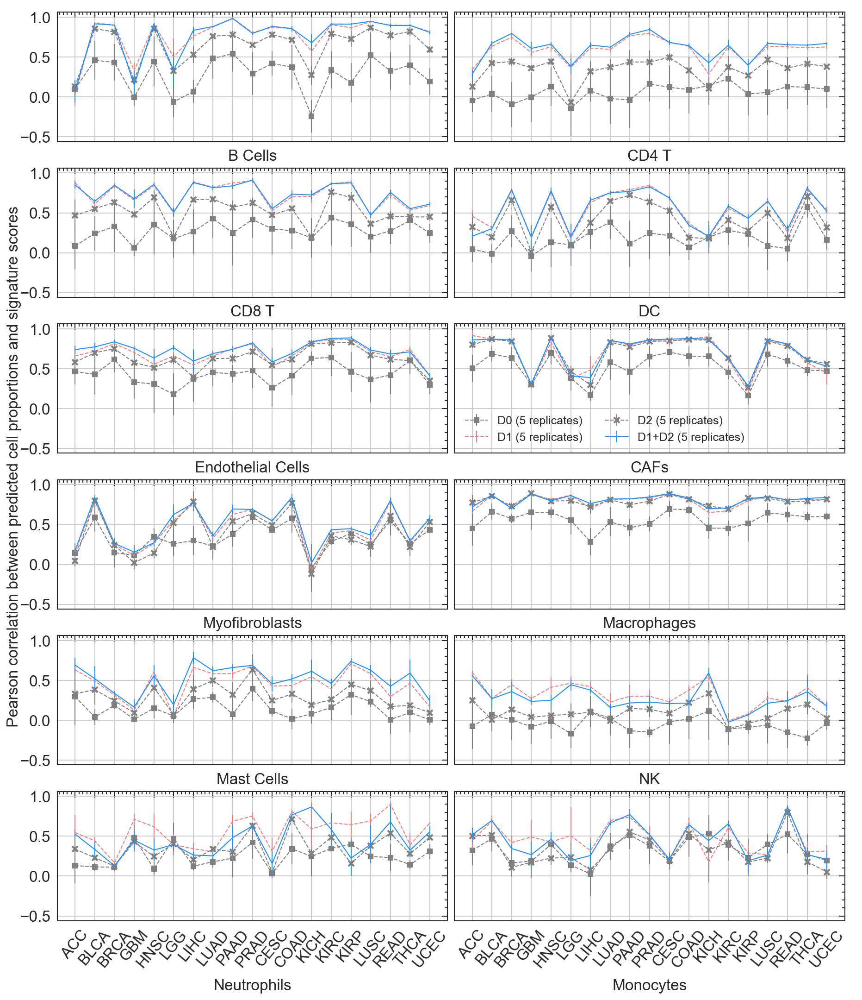

In [23]:
fig, axes = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(6.5, 7.5))
# plt.subplots_adjust(wspace=0.02, hspace=0.2)
inx2cell_type = dict(zip(inx, cell_types))
for i in range(6):
    for j in range(2):
        show_legend = False
        current_cell_type = inx2cell_type[(i, j)]
        current_corr = cell_type2sig_prop_corr[current_cell_type]
        print(f'Plotting {current_cell_type}')
        if current_cell_type == 'CAFs':
            show_legend = True

        plot_corr_across_all_tumors(corr=current_corr, cell_type=current_cell_type, ax=axes[i, j], show_legend=show_legend)
        
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel("Pearson correlation between predicted cell proportions and signature scores")

plt.tight_layout(h_pad=0.2, w_pad=0.02)
plt.savefig(os.path.join(fig_dir, 'r-sec4-1_pred_cell_prop_vs_signature_score_corr.png'), dpi=300)

## 03. r-sec4-2 (Scatter plot and TABLE 1)
Predicted cancer cell proportions vs CPEs for each cancer type across different algorithms
- RMSE, Pearson correlation, and concordance correlation coefficient (CCC)

### Merge predicted cell proportions across different cancer types

In [24]:
merged_dir = os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'merged_result')
cancer_purity_file_path = os.path.join(dataset_dir, 'cancer_purity', 'cancer_purity.csv')
tcga_sample_id2cancer_type_file_path = os.path.join(dataset_dir, 'TCGA', 'tpm', 'tcga_sample_id2cancer_type.csv')
if os.path.exists(merged_dir):
    shutil.rmtree(merged_dir)
check_dir(merged_dir)

In [25]:
algos = ['DeSide', 'DeSide_softmax', 'CIBERSORT_hnscc', 'EPIC_self', 'Scaden_ascites', 'Kassandra_self', 'CIBERSORT_luad', 'Scaden_simu_bulk']
algo2merged_file_path = {i: os.path.join(merged_dir, f'{i}_pred_cell_prop.csv') for i in algos}
algo2merged_file_path

{'DeSide': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/DeSide_pred_cell_prop.csv',
 'DeSide_softmax': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/DeSide_softmax_pred_cell_prop.csv',
 'CIBERSORT_hnscc': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/CIBERSORT_hnscc_pred_cell_prop.csv',
 'EPIC_self': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/EPIC_self_pred_cell_prop.csv',
 'Scaden_ascites': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/Scaden_ascites_pred_cell_prop.csv',
 'Kassandra_self': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/Kassandra_self_pred_cell_prop.csv',
 'CIBERSORT_luad': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/CIBERSORT_luad_pred_cell_prop.csv',
 'Scaden_simu_bulk': '../../tables_model_evaluation/predicted_cell_fractions/merged_result/Scaden_simu_bulk_pred_cell_prop.csv'}

In [26]:
pred_dir = './predicted_cell_prop'
algo2raw_result_dir = {
    'CIBERSORT_hnscc' : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'CIBERSORT_result', 'HNSCC_ref'),
    'CIBERSORT_luad'  : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'CIBERSORT_result', 'LUAD_ref'),
    'DeSide'          : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'DeSide_result', 'sigmoid_20231110_003'),
    'DeSide_softmax'  : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'DeSide_result', 'softmax_20231110_005'),
    'EPIC_self'       : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'EPIC_1125', 'EPIC_self_sig_and_ct', 'data'),
    'Scaden_ascites'  : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'Scaden_result', 'human_ascites_local'),
    'Scaden_simu_bulk': os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'Scaden_result', 'simu_bulk_merged_2ds_local'),
    'Kassandra_self'  : os.path.join(model_evaluation_dir, 'predicted_cell_fractions', 'Kassandra_result')
}
algo2raw_result_dir

{'CIBERSORT_hnscc': '../../tables_model_evaluation/predicted_cell_fractions/CIBERSORT_result/HNSCC_ref',
 'CIBERSORT_luad': '../../tables_model_evaluation/predicted_cell_fractions/CIBERSORT_result/LUAD_ref',
 'DeSide': '../../tables_model_evaluation/predicted_cell_fractions/DeSide_result/sigmoid_20231110_003',
 'DeSide_softmax': '../../tables_model_evaluation/predicted_cell_fractions/DeSide_result/softmax_20231110_005',
 'EPIC_self': '../../tables_model_evaluation/predicted_cell_fractions/EPIC_1125/EPIC_self_sig_and_ct/data',
 'Scaden_ascites': '../../tables_model_evaluation/predicted_cell_fractions/Scaden_result/human_ascites_local',
 'Scaden_simu_bulk': '../../tables_model_evaluation/predicted_cell_fractions/Scaden_result/simu_bulk_merged_2ds_local',
 'Kassandra_self': '../../tables_model_evaluation/predicted_cell_fractions/Kassandra_result'}

In [27]:
ct_removed = ['B Cells', 'CD4 T conv', 'CD4 Treg', 'CD8 T', 'Epithelial Cells', 'Glioma Cells', 'mDC', 'pDC', 'Fibroblasts']
sorted_cell_types2 = [i for i in sorted_cell_types if i not in ct_removed]
sorted_cell_types2

['Plasma B cells',
 'Non-plasma B cells',
 'CD4 T',
 'CD8 T effector',
 'CD8 T (GZMK high)',
 'Double-neg-like T',
 'Cancer Cells',
 'DC',
 'Endothelial Cells',
 'CAFs',
 'Myofibroblasts',
 'Macrophages',
 'Mast Cells',
 'NK',
 'Neutrophils',
 'Monocytes']

In [28]:
sorted_cell_types3 = ['B Cells', 'CD4 T', 'CD8 T', 'Cancer Cells', 'DC', 'Endothelial Cells', 'Fibroblasts', 'Macrophages', 'Mast Cells', 'NK']

In [29]:
# mapping cell type names
ct_without_neutrophils = [i for i in sorted_cell_types3 if i != 'Neutrophils']
algo2cell_type_name_mapping = {
        'CIBERSORT_hnscc': {'B cell': 'B Cells', 'T cells CD4': 'CD4 T', 'T cells CD8': 'CD8 T', 'Dendritic': 'DC',
                            'Malignant': 'Cancer Cells', 'Endothelial': 'Endothelial Cells',
                            'Fibroblast': 'Fibroblasts', 'Macrophage': 'Macrophages', 'Mast': 'Mast Cells',
                            },
        'CIBERSORT_luad': dict(zip(ct_without_neutrophils, ct_without_neutrophils)),
        'DeSide': dict(zip(sorted_cell_types2, sorted_cell_types2)),
        'DeSide_softmax': dict(zip(sorted_cell_types2, sorted_cell_types2)),
        'EPIC_self': {'B.cells': 'B Cells', 'CD4.T': 'CD4 T', 'CD8.T': 'CD8 T',
                      'otherCells': 'Cancer Cells', 'Endothelial.Cells': 'Endothelial Cells',
                      'Fibroblasts': 'Fibroblasts',  'NK': 'NK', 'Macrophages': 'Macrophages',
                      },
        'Scaden_ascites': {'CD4Tcells': 'CD4 T', 'CD8Tcells': 'CD8 T', 'Carcinoma': 'Cancer Cells',
                           'DC': 'DC', 'Fibroblast': 'Fibroblasts', 'NK': 'NK',
                          },
        'Scaden_simu_bulk': dict(zip(sorted_cell_types3, sorted_cell_types3)),
        'Kassandra_self': {'B_cells': 'B Cells', 'CD4_T_cells': 'CD4 T', 'CD8_T_cells': 'CD8 T',
                           'Endothelium': 'Endothelial Cells', 'Fibroblasts': 'Fibroblasts', 'Macrophages': 'Macrophages',
                           'NK_cells': 'NK', 'Neutrophils': 'Neutrophils', 'Other': 'Cancer Cells'},
}

In [30]:
for algo, m_fp in algo2merged_file_path.items():
    print(f'Merge the results of {algo}...')
    read_and_merge_result(raw_result_dir=algo2raw_result_dir[algo], algo=algo,
                          result_file_path=algo2merged_file_path[algo],
                          cell_type_name_mapping=algo2cell_type_name_mapping[algo],
                          tcga_sample2cancer_type_file_path=tcga_sample_id2cancer_type_file_path)

Merge the results of DeSide...
Merge the results of DeSide_softmax...
Merge the results of CIBERSORT_hnscc...
Merge the results of EPIC_self...
Merge the results of Scaden_ascites...
Merge the results of Kassandra_self...
Merge the results of CIBERSORT_luad...
Merge the results of Scaden_simu_bulk...


In [31]:
tcga_sample_id2cancer_type = pd.read_csv(tcga_sample_id2cancer_type_file_path, index_col=0)
print(tcga_sample_id2cancer_type.shape)
tcga_sample_id2cancer_type.head(2)

(7699, 1)


,cancer_type
TCGA-OR-A5LO-01A,ACC
TCGA-P6-A5OG-01A,ACC


In [32]:
cpe = read_cancer_purity(cancer_purity_file_path=cancer_purity_file_path, sample_names=tcga_sample_id2cancer_type.index.to_list())
print(cpe.shape)
cpe.head(2)

(7452, 7)


,Cancer type,ESTIMATE,ABSOLUTE,LUMP,IHC,CPE,Unnamed: 7
Sample ID,,,,,,,
TCGA-G9-6499-01A,PRAD,0.9540,NaN,0.9429,0.525,0.948,NaN
TCGA-AX-A2HH-01A,UCEC,0.9929,0.94,0.9193,0.960,0.970,NaN


In [33]:
tcga_cpe_intersection = tcga_sample_id2cancer_type.merge(cpe.loc[:, ['CPE']], left_index=True, right_index=True)
tcga_cpe_intersection.index = tcga_cpe_intersection.index.map(lambda x: x.replace('.', '-'))
print(tcga_cpe_intersection.shape)
tcga_cpe_intersection.head(2)

(7452, 2)


,cancer_type,CPE
TCGA-OR-A5LO-01A,ACC,0.9954
TCGA-P6-A5OG-01A,ACC,0.4616


In [34]:
algo_new_names = {
    'DeSide': 'DeSide \n (Simu bulk)', 'DeSide_softmax': 'DeSide \n (softmax)', 'CIBERSORT_hnscc': 'CIBERSORT \n (HNSCC)', 'CIBERSORT_luad': 'CIBERSORT \n (LUAD)', 
    'EPIC_self': 'EPIC \n (Default)', 'Scaden_ascites': 'Scaden \n (Ascites)', 
    'Scaden_simu_bulk': 'Scaden \n (Simu bulk)', 'Kassandra_self': 'Kassandra \n (Default)'
}

In [35]:
def compare_y_y_pred_plot(y_true: pd.Series, y_pred: pd.Series, inx=tuple(), cancer_type='', 
                          algo='', show_metrics: bool = False, ax=None):
    """
    Plot y against y_pred to visualize the performance of prediction result

    :param y_true: CPE

    :param y_pred: this file contains the predicted value of y

    :param inx: a tuple of two elements, the first element is the index of y_true, the second element is the index of y_pred

    :param cancer_type: cancer type

    :param algo: algorithm name

    :param show_metrics: show correlation and RMSE

    :param ax: matplotlib axis

    :return: None
    """
    # Use the pyplot interface to change just one subplot...
    plt.sca(ax)

    plt.scatter(y_pred, y_true, s=1, alpha=0.75, rasterized=True)
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xticks([0, 1])
    plt.yticks([0, 0.5, 1])
    x_left, x_right = plt.xlim()
    y_bottom, y_top = plt.ylim()
    x_max = x_right
    y_max = y_top
    plt.plot([0, max(x_max, y_max)], [0, max(x_max, y_max)], linestyle='--', color='tab:gray')
    corr = 0
    rmse = 0
    ccc = 0
    if show_metrics:  # show metrics in test set
        corr, p_value = get_corr(y_pred, y_true, return_p_value=True)
        rmse = calculate_rmse(y_true=pd.DataFrame(y_true), y_pred=pd.DataFrame(y_pred))
        ccc = get_ccc(y_pred.values, y_true.values)
        plt.text(0.3 * x_max, 0.2 * y_max, '$r={:.2f}$'.format(corr), fontsize=5)
        if p_value < 0.001:
            plt.text(0.65 * x_max, 0.2 * y_max, '(p<0.001)'.format(p_value), fontsize=5)
        else:
            plt.text(0.65 * x_max, 0.2 * y_max, '(p={:.3f})'.format(p_value), fontsize=5)
        plt.text(0.3 * x_max, 0.1 * y_max, '$RMSE={:.2f}$'.format(rmse), fontsize=5)
        plt.text(0.3 * x_max, 0.0 * y_max, '$CCC={:.3f}$'.format(ccc), fontsize=5)
    if inx and inx[1] == 0:
        plt.ylabel(f'{cancer_type} ({y_true.shape[0]})', fontsize=6)
    if inx and inx[0] == 8:
        plt.xlabel(f'{algo}', fontsize=6)
    # plt.legend()
    return corr, rmse, ccc

In [36]:
metrics_value = {}

#### Part 1

In [37]:
cancer_types_part1 = sorted(cancer_types)[:9]
cancer_types_part1

['ACC', 'BLCA', 'BRCA', 'CESC', 'COAD', 'GBM', 'HNSC', 'KICH', 'KIRC']

Plotting ACC...
Plotting BLCA...
Plotting BRCA...
Plotting CESC...
Plotting COAD...
Plotting GBM...


/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Plotting HNSC...
Plotting KICH...


/Users/belter/miniconda3/envs/deside_obj/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Plotting KIRC...


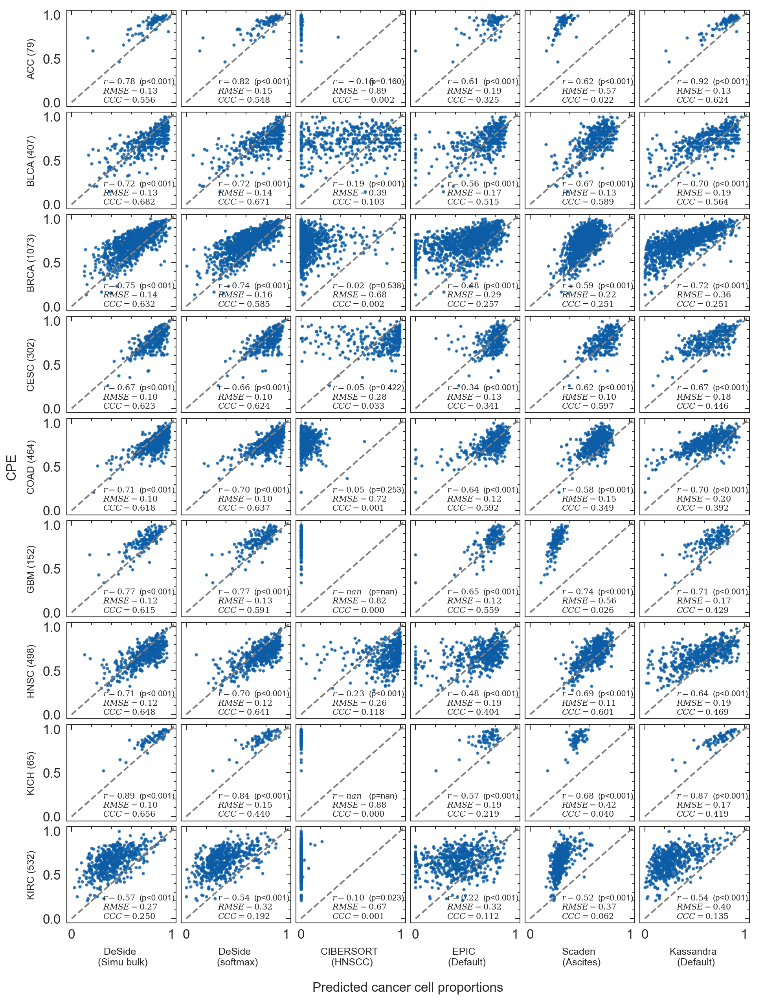

In [38]:
# y_true = ReadH5AD(y_true_file_path).get_cell_fraction()
fig, axes = plt.subplots(9, 6, sharex=True, sharey=True, figsize=(7, 9))
for i in range(9):
    current_cancer_type = cancer_types_part1[i]
    print(f'Plotting {current_cancer_type}...')
    current_cpe = tcga_cpe_intersection.loc[tcga_cpe_intersection['cancer_type'] == current_cancer_type, ['CPE']]
    for j in range(6):
        current_algo = algos[j]
        if current_algo not in ['CIBERSORT_luad', 'Scaden_simu_bulk']:
            y_pred_file_path = algo2merged_file_path[current_algo]
            y_pred = pd.read_csv(y_pred_file_path, index_col='sample_id')
            intersect_inx = [i for i in current_cpe.index.to_list() if i in y_pred.index]
            # print(intersect_inx, len(intersect_inx))
            current_cpe = current_cpe.loc[intersect_inx, :].copy()
            y_pred = y_pred.loc[intersect_inx, 'Cancer Cells'].copy()
            # print(current_cpe.shape, y_pred.shape)
            assert np.all(current_cpe.index == y_pred.index)
            corr, rmse, ccc = compare_y_y_pred_plot(y_pred=y_pred, y_true=current_cpe.squeeze(), show_metrics=True, ax=axes[i, j], cancer_type=current_cancer_type, algo=algo_new_names[current_algo], inx=(i,j))
            metrics_value[(current_algo, current_cancer_type)] = {'corr': corr, 'rmse': rmse, 'ccc': ccc}

# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel('Predicted cancer cell proportions', labelpad=25)
plt.ylabel("CPE", labelpad=15)

plt.tight_layout(h_pad=0.02, w_pad=0.02)
plt.savefig(os.path.join(fig_dir, 'r-sec4-2_pred_cancer_cell_prop_vs_cpe-part1.svg'), dpi=300)

#### Part 2

In [39]:
cancer_types_part2 = sorted(cancer_types)[9:]
cancer_types_part2 = [i for i in cancer_types_part2 if i != 'PAAD']
cancer_types_part2

['KIRP', 'LGG', 'LIHC', 'LUAD', 'LUSC', 'PRAD', 'READ', 'THCA', 'UCEC']

Plotting KIRP...
Plotting LGG...
Plotting LIHC...
Plotting LUAD...
Plotting LUSC...
Plotting PRAD...
Plotting READ...
Plotting THCA...
Plotting UCEC...


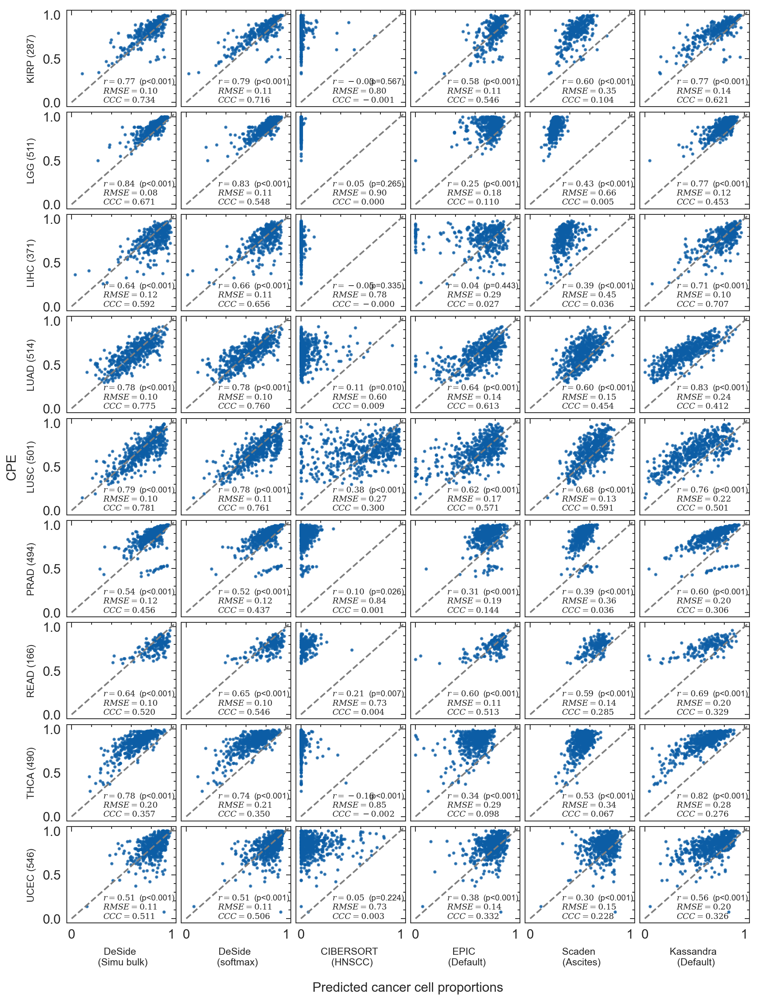

In [40]:
# y_true = ReadH5AD(y_true_file_path).get_cell_fraction()
fig, axes = plt.subplots(9, 6, sharex=True, sharey=True, figsize=(7, 9))
for i in range(9):
    current_cancer_type = cancer_types_part2[i]
    print(f'Plotting {current_cancer_type}...')
    current_cpe = tcga_cpe_intersection.loc[tcga_cpe_intersection['cancer_type'] == current_cancer_type, ['CPE']]
    for j in range(6):
        current_algo = algos[j]
        if current_algo not in ['CIBERSORT_luad', 'Scaden_simu_bulk']:
            y_pred_file_path = algo2merged_file_path[current_algo]
            y_pred = pd.read_csv(y_pred_file_path, index_col='sample_id')
            
            intersect_inx = [i for i in current_cpe.index.to_list() if i in y_pred.index]
            # print(intersect_inx, len(intersect_inx))
            current_cpe = current_cpe.loc[intersect_inx, :].copy()
            y_pred = y_pred.loc[intersect_inx, 'Cancer Cells'].copy()
            # print(current_cpe.shape, y_pred.shape)
            assert np.all(current_cpe.index == y_pred.index)
            
            corr, rmse, ccc = compare_y_y_pred_plot(y_pred=y_pred, y_true=current_cpe.squeeze(), show_metrics=True, ax=axes[i, j], cancer_type=current_cancer_type, algo=algo_new_names[current_algo], inx=(i,j))
            metrics_value[(current_algo, current_cancer_type)] = {'corr': corr, 'rmse': rmse, 'ccc': ccc}

# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel('Predicted cancer cell proportions', labelpad=25)
plt.ylabel("CPE", labelpad=15)

plt.tight_layout(h_pad=0.02, w_pad=0.02)
plt.savefig(os.path.join(fig_dir, 'r-sec4-2_pred_cancer_cell_prop_vs_cpe-part2.svg'), dpi=300)

In [41]:
metrics_value_df = pd.DataFrame.from_dict(metrics_value, orient='index')
metrics_value_df.index.names = ['algorithm', 'cancer_type']
print(metrics_value_df.shape)
metrics_value_df.head(2)

(108, 3)


,,corr,rmse,ccc
algorithm,cancer_type,,,
DeSide,ACC,0.784109,0.134205,0.555562
DeSide_softmax,ACC,0.818602,0.146500,0.547905


In [42]:
metrics_value_df.to_csv(os.path.join(fig_dir, 'pred_cancer_cell_prop_vs_cpe.csv'), float_format='%.3f')

In [43]:
fig_dir

'./sup_fig_results/'

## 04. m-sec5-1
The histogram represents the L1 norm distance between the median gene expression profile (mGEP) and 7,699 samples in the TCGA dataset in PCA space.

In [44]:
# explain 90% variance
tcga_pca = pd.read_csv(os.path.join(dataset_dir, 'TCGA', 'pca_model_0.9', 'tcga_pca_ref.csv'))
print(tcga_pca.shape)
tcga_pca.head(2)

(7699, 577)


,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,566,567,568,569,570,571,572,573,574,575
0,0,46.785213,67.949820,-25.276556,15.031482,-17.333698,7.518884,33.898220,-13.163341,-11.842615,...,2.031248,-2.118241,-0.847054,0.675434,0.041054,-0.016176,2.067030,1.689149,1.466463,3.011712
1,1,0.797879,7.837702,-7.671864,-36.962994,-3.852147,1.361622,-33.481007,-11.849536,-5.335111,...,-0.421078,1.789778,-1.038148,0.839676,-0.680863,0.710391,-3.217569,-2.195262,0.010058,-1.465350


In [45]:
median_gep_ref = tcga_pca.median(axis=0).values.reshape(1, -1)  # TPM / PCs
l1_distance_with_center_ref = np.linalg.norm(tcga_pca - median_gep_ref,
                                             ord=1, axis=1)
q_dis_nn_ref = np.quantile(l1_distance_with_center_ref, 0.95)
q_dis_nn_ref

5305.5356059299065

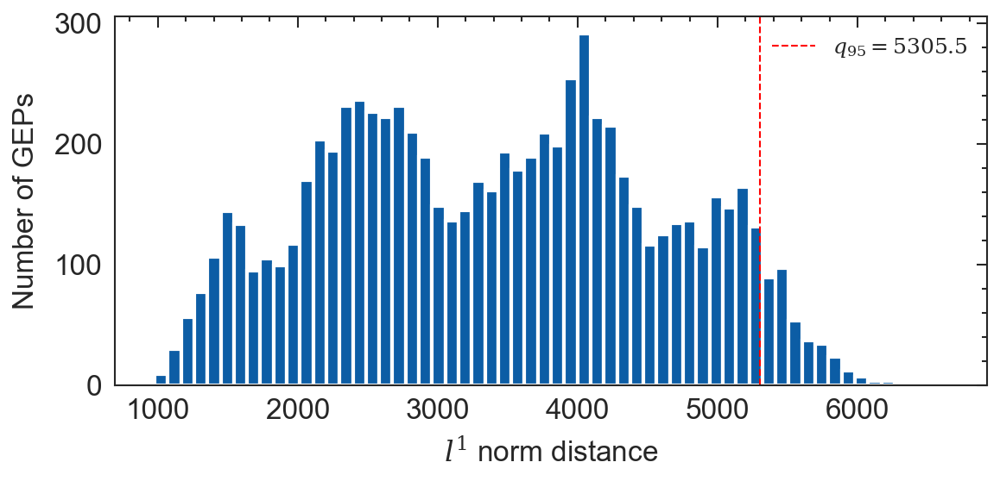

In [46]:
# sns.set(font_scale=1.5)
fig, ax = plt.subplots(1, 1, figsize=(4, 2))

ax.hist(l1_distance_with_center_ref, bins=60)
ax.axvline(q_dis_nn_ref, color='red', linestyle='--', label='$q_{95}=5305.5$', linewidth=0.5)

ax.set_xlabel('$l^{1}$ norm distance')
ax.set_ylabel('Number of GEPs')
# ax.xaxis.set_label_coords(0.45, -0.2)
ax.legend(fontsize=6, loc='upper right')
plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'l1_norm_with_median_gene_values_tcga.png'), dpi=300)

## 05. Merged scRNA-seq dataset

In [47]:
merged_ds = an.read_h5ad(os.path.join(dataset_dir, 'single_cell', 'merged_12_sc_datasets_231003.h5ad'))
merged_ds

AnnData object with n_obs × n_vars = 325474 × 17834
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample_id', 'batch', 'leiden1', 'dataset_id', 'original_cell_type', 'cell_type1', 'leiden', 'cell_type_first_round', 'cell_subtype', 'cell_type'
    var: 'gene_ids', 'n_cells', 'total_counts', 'n_counts'
    uns: 'cell_subtype_colors', 'cell_type1_colors', 'cell_type_colors', 'cell_type_first_round_colors', 'dataset_id_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'original_cell_type_colors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [48]:
# down sampling
merged_ds_obs = merged_ds.obs.sample(10000)
merged_ds_small = merged_ds[merged_ds_obs.index, :].copy()
merged_ds_small

AnnData object with n_obs × n_vars = 10000 × 17834
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample_id', 'batch', 'leiden1', 'dataset_id', 'original_cell_type', 'cell_type1', 'leiden', 'cell_type_first_round', 'cell_subtype', 'cell_type'
    var: 'gene_ids', 'n_cells', 'total_counts', 'n_counts'
    uns: 'cell_subtype_colors', 'cell_type1_colors', 'cell_type_colors', 'cell_type_first_round_colors', 'dataset_id_colors', 'dendrogram_leiden', 'leiden', 'log1p', 'neighbors', 'original_cell_type_colors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [49]:
sc._settings.ScanpyConfig.figdir = Path(fig_dir)
rcParams['figure.figsize'] = 6, 6

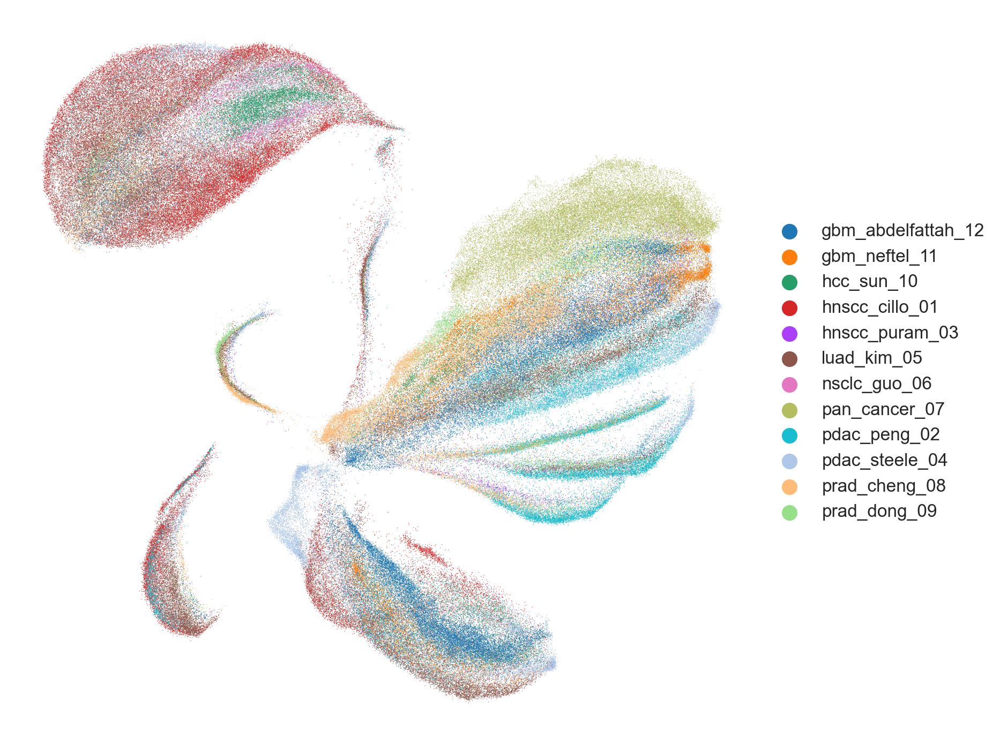

In [50]:
sc.pl.umap(merged_ds, color='dataset_id', 
           title='', frameon=False, 
           save='_merged_after_remove_batch_effect_dataset_id_12ds.png')

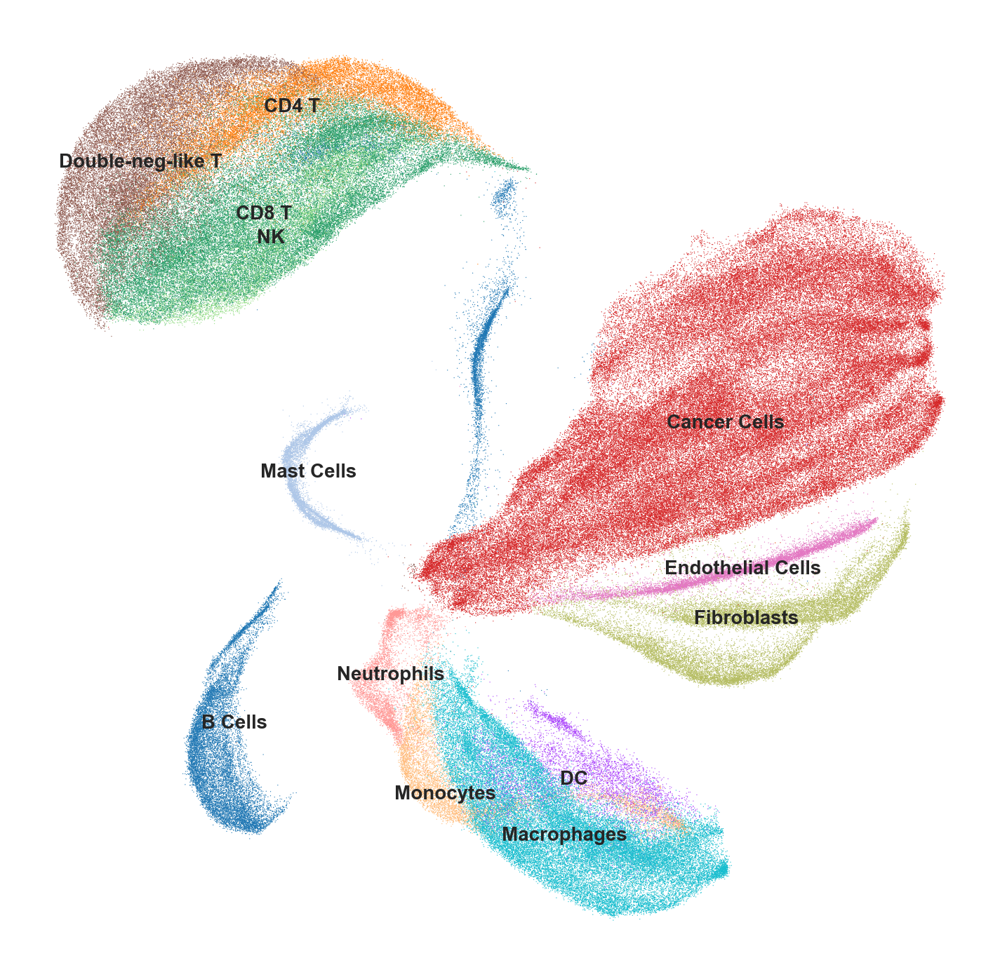

In [51]:
sc.pl.umap(merged_ds, color='cell_type', legend_loc='on data', legend_fontsize='small', title='', frameon=False, 
           save='_merged_filtered_cell_type_12ds.png')

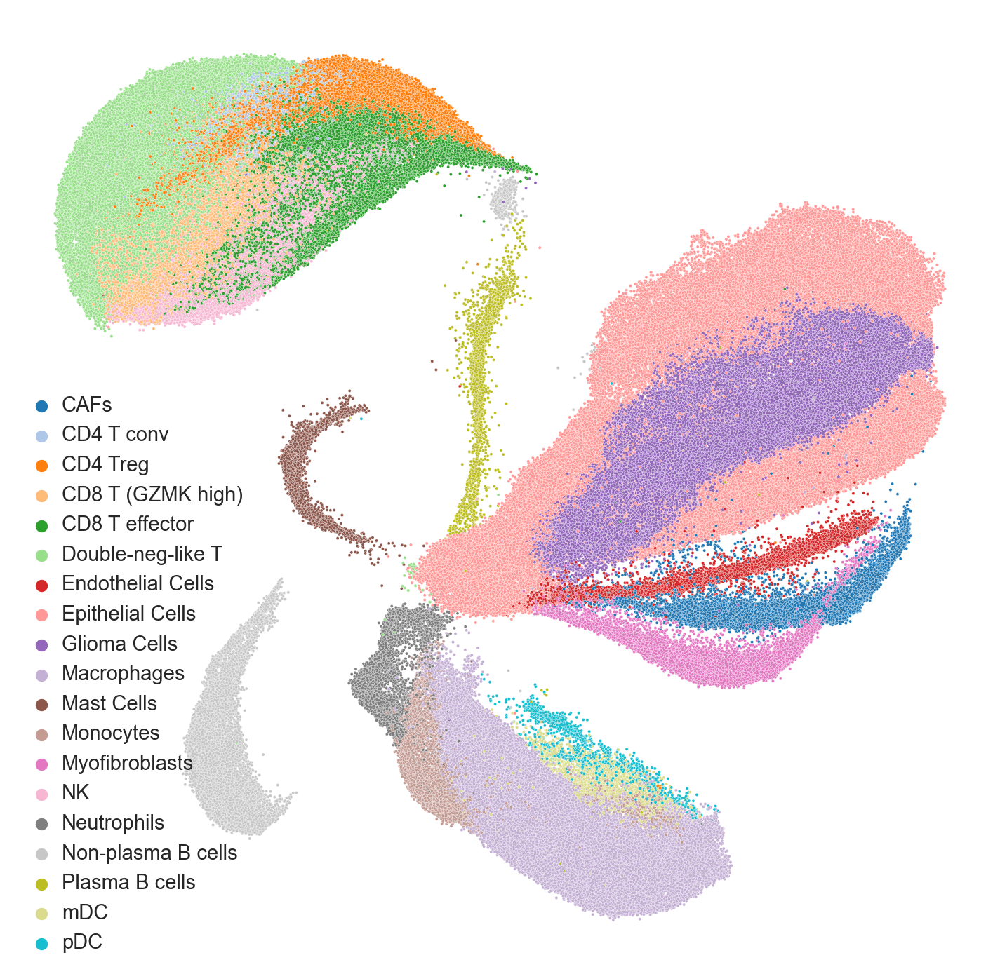

In [58]:
g1 = sns.scatterplot(x=merged_ds.obsm['X_umap'][:, 0], y=merged_ds.obsm['X_umap'][:, 1],
                     hue=merged_ds.obs['cell_subtype'], s=1, rasterized=True , palette='tab20')
g1legend = g1.legend()
for _ in g1legend.legendHandles:
    _.set_sizes([10])
# g1.legend([],[], frameon=False)
sns.move_legend(g1, "lower left", bbox_to_anchor=(0, 0), ncol=1, title=None, frameon=False, fontsize=7, borderpad=0, handletextpad=0)
g1.axis('off')
# g1.text(weight='bold')
plt.savefig(os.path.join(fig_dir, 'umap_merged_filtered_cell_subtype_12ds_new_with_legend.svg'), dpi=300)

In [59]:
merged_ds_step1 = an.read_h5ad(os.path.join(dataset_dir, 'single_cell', '12datasets_merged_before_batch_correction.h5ad'))
merged_ds_step1

AnnData object with n_obs × n_vars = 340235 × 17834
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample_id', 'batch', 'leiden1', 'dataset_id', 'original_cell_type', 'cell_type1', 'leiden'
    var: 'gene_ids', 'n_cells', 'total_counts', 'n_counts'
    uns: 'dataset_id_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

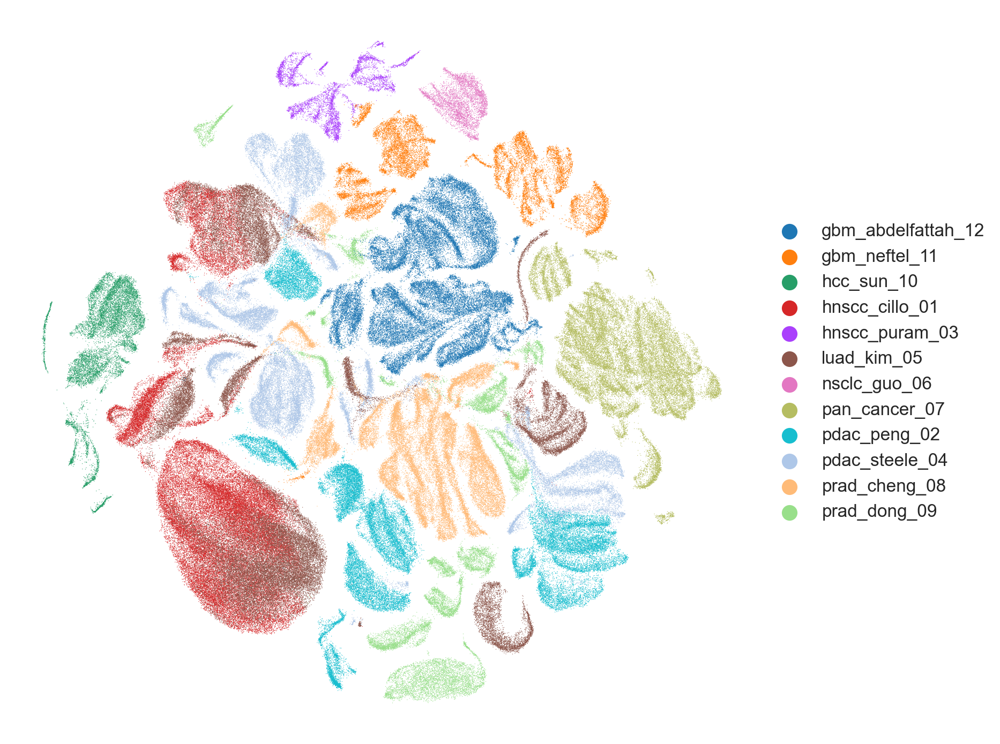

In [60]:
sc.pl.umap(merged_ds_step1, color='dataset_id', 
           title='', frameon=False, 
           save='_merged_before_remove_batch_effect_dataset_id_12ds.png')